# Dicom loading and visualization

#### Cargar Archivos DICOM
Cargo los archivos DICOM desde el directorio especificado. Trabajo inicialmente con un subconjunto de los archivos para testear.

**¿Con que CT trabajo? No me ha quedado claro qué subconjunto de archivos usar!**
1) ct_directory = "C:/Users/Pedro/Documents/GitHub/Medial_Image_Pydicom/HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/03-14-1998-NA-CT ABDOMEN WWO CONT-48924/4.000000-Recon 2 3 PHASE LIVER ABD-87008"
2) ct_directory_2 = "C:/Users/Pedro/Documents/GitHub/Medial_Image_Pydicom/HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/03-14-1998-NA-CT ABDOMEN WWO CONT-48924/2.000000-PRE LIVER-48636"



#### Libraries

In [107]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt
from typing import List
import cv2
import matplotlib.colors
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation


#### Aqui alojamos las funciones

In [108]:
def load_dicom_files(directory: str, file_extension: str = '.dcm'):
    """Load DICOM files from a specified directory that match the given file extension."""
    return [pydicom.dcmread(os.path.join(directory, f)) for f in os.listdir(directory) if f.endswith(file_extension)]
    
def sort_dicom_files_by_instance_number(dicom_files: List[pydicom.Dataset]) -> List[pydicom.Dataset]:
    """Sort DICOM files by the Instance Number."""
    return sorted(dicom_files, key=lambda x: int(x.InstanceNumber))

def sort_dicom_files_by_position(dicom_files):
    """Ordena archivos DICOM según la posición del paciente en la imagen."""
    return sorted(dicom_files, key=lambda x: float(x.ImagePositionPatient[2]))

def sort_dicom_files(dicom_files):
    """Sort DICOM files by available headers, only including those with AcquisitionNumber equal to 2."""
    def get_sort_key(file):
        # Define sorting key: ImagePositionPatient (converted to a sortable form)
        position_patient = getattr(file, 'ImagePositionPatient', None)
        if position_patient:
            position_patient = float(position_patient[2])
        return position_patient if position_patient else 0

    # Filter to include only files with AcquisitionNumber equal to 2 --> With 3D Slicer we have seen is the correct one
    filtered_files = [file for file in dicom_files if getattr(file, 'AcquisitionNumber', None) == '2']
    
    '''
    Primero ordena por AcquisitionNumber y, dentro de cada número de adquisición, 
    ordena por la posición del paciente a lo largo del eje Z (ImagePositionPatient[2]).'''
    # Sort the filtered files by ImagePositionPatient along the Z-axis
    return sorted(filtered_files, key=get_sort_key)


def check_acquisition_uniformity(dicom_files: List[pydicom.Dataset]):
    """Check if all DICOM files have the same 'Acquisition Number'."""
    acquisition_numbers = {img.AcquisitionNumber for img in dicom_files}
    if len(acquisition_numbers) > 1:
        print("Multiple acquisition numbers found. Ensure all CT images are from a single acquisition.")
    else:
        print("Only a single acquisition")
    
def get_pixel_arrays(dicom_files: List[pydicom.Dataset]) -> np.ndarray:
    """Extract pixel arrays from sorted DICOM files and stack them into a single numpy array."""
    return np.stack([file.pixel_array for file in dicom_files])

def display_images(ct_image, seg_image):
    """Display CT and Segmentation images side-by-side."""
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(ct_image, cmap='gray', aspect='auto')
    plt.title('CT Slice')

    plt.subplot(1, 2, 2)
    plt.imshow(seg_image, cmap='gray', aspect='auto')
    plt.title('Segmentation Slice')
    plt.show()

def apply_window(image: np.ndarray, window_center: int, window_width: int) -> np.ndarray:
    """Apply window leveling to an image based on the given center and width."""
    lower_bound = window_center - 0.5 * window_width
    upper_bound = window_center + 0.5 * window_width
    return np.clip((image - lower_bound) / window_width, 0, 1)

In [109]:
# Data paths
# Windows
#ct_directory = "C:/Users/pedromarti/Documents/GitHub/Medial_Image_Pydicom/HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/03-14-1998-NA-CT ABDOMEN WWO CONT-48924/4.000000-Recon 2 3 PHASE LIVER ABD-87008"
#seg_directory = "C:/Users/pedromarti/Documents/GitHub/Medial_Image_Pydicom/HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/300.000000-Segmentation-39839/1-1.dcm"

# Mac
ct_directory = "HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/4.000000-Recon 2 LIVER 3 PHASE AP-28011/"
seg_directory = "HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/300.000000-Segmentation-39839/1-1.dcm"


### Cargamos las imagenes y las ordenamos

Cargamos y ordenamos las imagenes CT. Como ya hemos visto en el 3D Slicer, cogemos la acquisition number 2.

In [5]:
# Load and process DICOM CT images
ct_files = load_dicom_files(ct_directory)
sorted_ct_files = sort_dicom_files(ct_files)


Cargamos la segmentation image

In [110]:
# Load and process segmentation image
dicom_segmentation = pydicom.dcmread(seg_directory)
segmentation_image = dicom_segmentation.pixel_array

Simple visualización para saber que todo ha ido bien

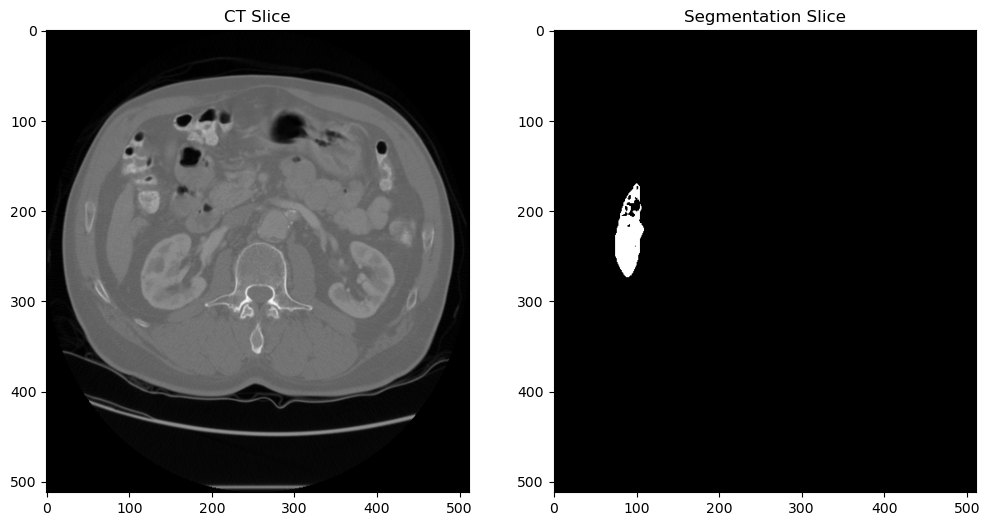

In [111]:
# Visualize a slice of CT and Segmentation images
ct_images = get_pixel_arrays(sorted_ct_files)
display_images(ct_images[8], segmentation_image[8])


Como sabemos que tiene 4 regiones en la segmentación y 300 registros, dividimos 300/4 y así sabemos que cada región tiene 75 registros.

#### Estudio de encabezados

In [112]:
# Print details and dimensions
print("Details of CT images sorted by Image Position Patient:")
for img in sorted_ct_files:
    print(f"Acquisition Number: {img.AcquisitionNumber}, Image Position Patient: {img.ImagePositionPatient}")

print("Dimensiones del arreglo de segmentación:", segmentation_image.shape)
print("Dimensiones del arreglo de imágenes CT:", ct_images.shape)

Details of CT images sorted by Image Position Patient:
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -240.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -237.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -235.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -232.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -230.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -227.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -225.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -222.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -220.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -217.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -

Ahora ya tenemos la acquisition que mejor queda con nuestra segmentación.

OLD:

Confirmamos que hay más de una adquisición

**Que hago aqui? Hay más de una adquisición pero solo debe haber una. En los obejtivos pone "Asegurar que solo haya una adquisicion".**

In [113]:
check_acquisition_uniformity(sorted_ct_files)

Only a single acquisition


#### Aplicamos windowing a las imagenes para mejorarlas

In [114]:
# Windowing parameters
window_center, window_width = 40, 400
windowed_ct_images = np.array([apply_window(img, window_center, window_width) for img  in ct_images])

In [115]:
# Tomamos el primer archivo DICOM para obtener los metadatos
first_dicom_file = sorted_ct_files[0]  

# Obtener información del voxel
pixel_spacing = first_dicom_file.PixelSpacing  # Lista: [tamaño del pixel en X, tamaño del pixel en Y]
slice_thickness = first_dicom_file.SliceThickness  # Espesor de la rebanada en direccion Z

# Calcular las proporciones de aspecto
aspect_ratio_coronal = slice_thickness / pixel_spacing[0]
aspect_ratio_sagittal = slice_thickness / pixel_spacing[1]

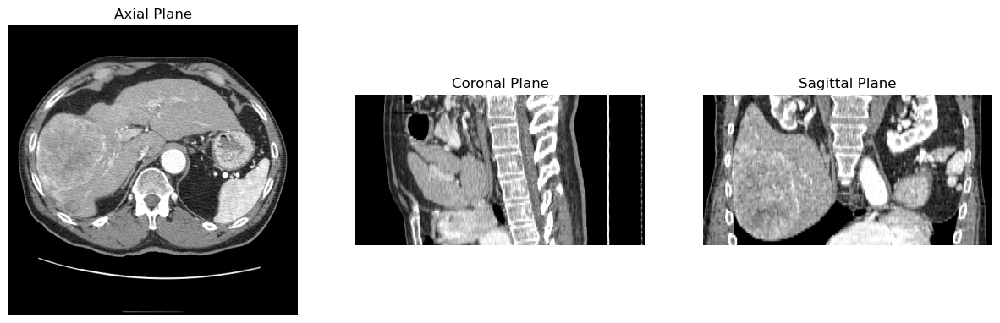

In [116]:
import matplotlib.pyplot as plt

def visualize_planes(ct_volume: np.ndarray):
    """Visualize axial, coronal, and sagittal planes of a CT volume with corrected aspect ratios."""
    # Determinar los planos
    axial_plane = ct_volume[ct_volume.shape[0] // 2, :, :]
    coronal_plane = ct_volume[:, :, ct_volume.shape[2] // 2]
    sagittal_plane = ct_volume[:, ct_volume.shape[1] // 2, :]

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Visualizar el plano Axial
    axes[0].imshow(axial_plane, cmap='gray')
    axes[0].set_title('Axial Plane')
    axes[0].axis('off')

    # Visualizar el plano Coronal con la proporción de aspecto corregida
    axes[1].imshow(coronal_plane, cmap='gray', aspect=aspect_ratio_coronal)
    axes[1].set_title('Coronal Plane')
    axes[1].axis('off')

    # Visualizar el plano Sagital con la proporción de aspecto corregida
    axes[2].imshow(sagittal_plane, cmap='gray', aspect=aspect_ratio_sagittal)
    axes[2].set_title('Sagittal Plane')
    axes[2].axis('off')

    plt.show()

visualize_planes(windowed_ct_images)

#### Aplicamos alpha-fusion

In [127]:
# Cargamos los registros a su region
img_liver = segmentation_image[1:75,:,:]
img_mass = segmentation_image[76:150,:,:]
img_portal_vein = segmentation_image[151:225,:,:]
img_abdominal_aorta = segmentation_image[226:300,:,:]

img_segmented = (img_liver*1) + (img_mass*2) + (img_portal_vein*3) + (img_abdominal_aorta*4)

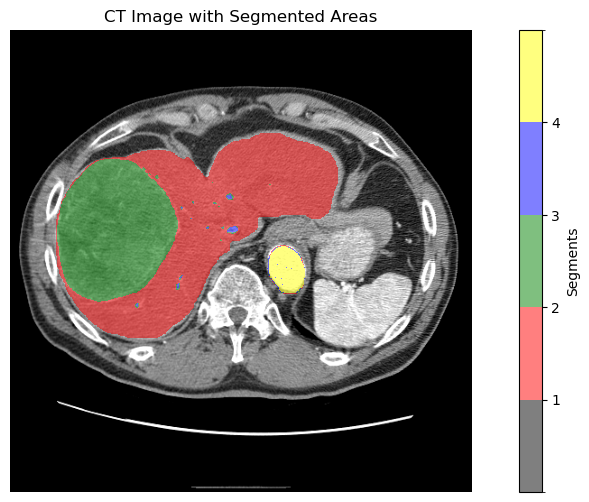

In [118]:
import matplotlib.colors as mcolors

# Colormap para las segmentaciones
cmap = mcolors.ListedColormap(['none', 'red', 'green', 'blue', 'yellow'])  # 'none' es para transparencia
bounds = [0, 1, 2, 3, 4, 5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

def plot_ct_with_segmentations(ct_image, segmentation):
    plt.figure(figsize=(12, 6))

    # Mostrar imagen CT
    plt.imshow(ct_image, cmap='gray')

    # Superponer la segmentación
    plt.imshow(segmentation, cmap=cmap, norm=norm, alpha=0.5)  # Alpha para transparencia

    plt.title('CT Image with Segmented Areas')
    plt.axis('off')
    plt.colorbar(ticks=[1, 2, 3, 4], label='Segments')
    plt.show()

slice_index = 48 # Índice de la slice a visualizar
plot_ct_with_segmentations(windowed_ct_images[slice_index, :, :], img_segmented[slice_index, :, :])

#### Prueba: Superposición de las CT sobre la segmentada 

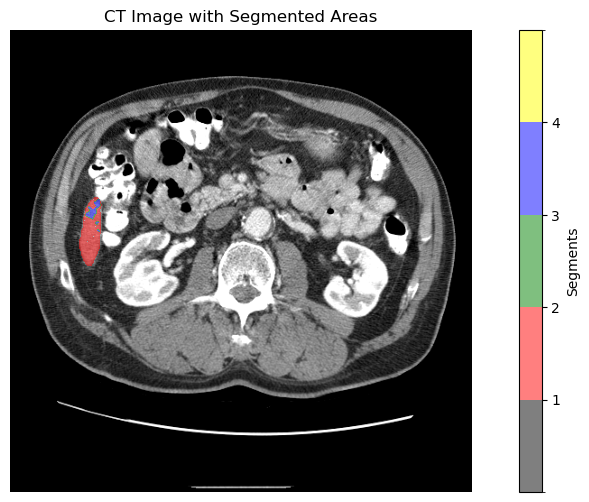

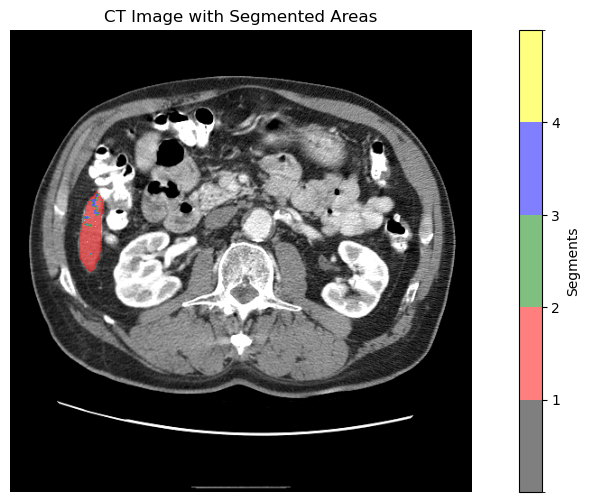

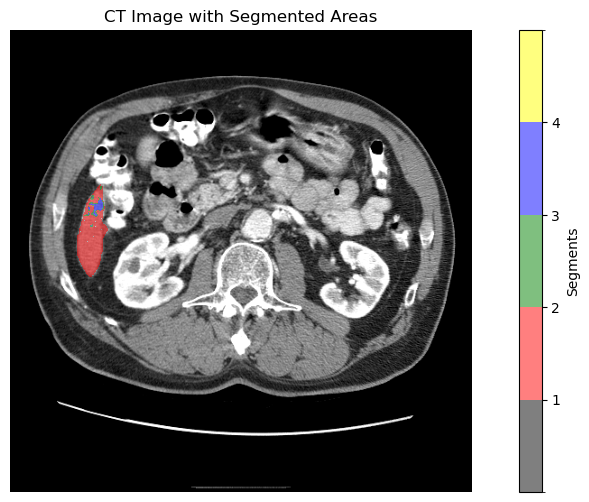

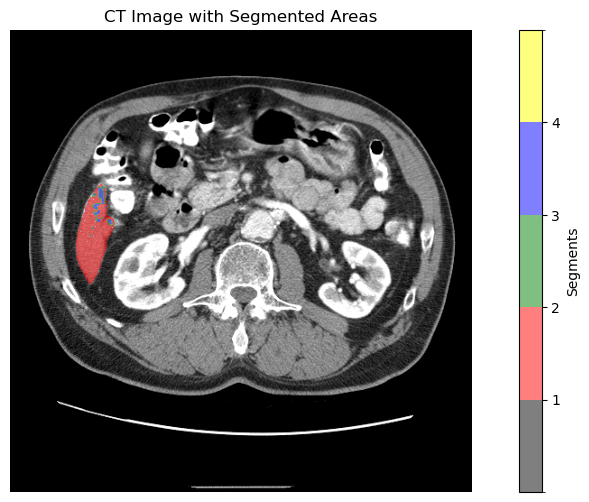

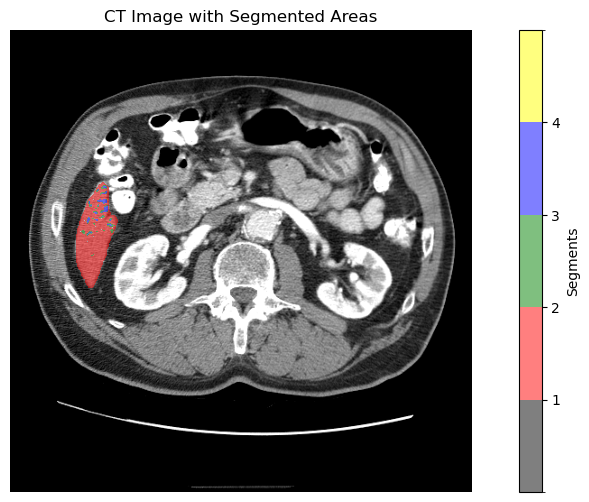

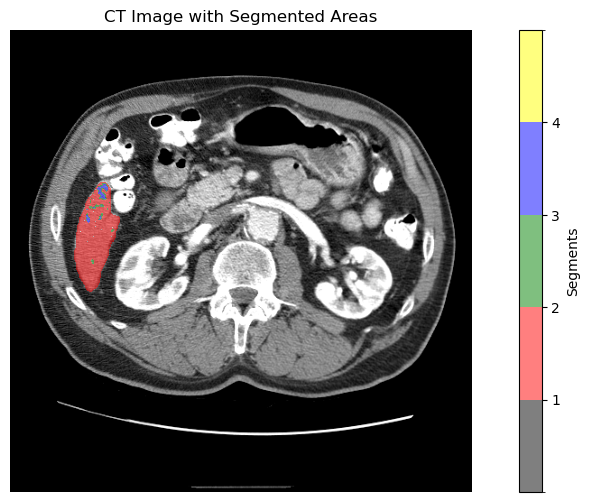

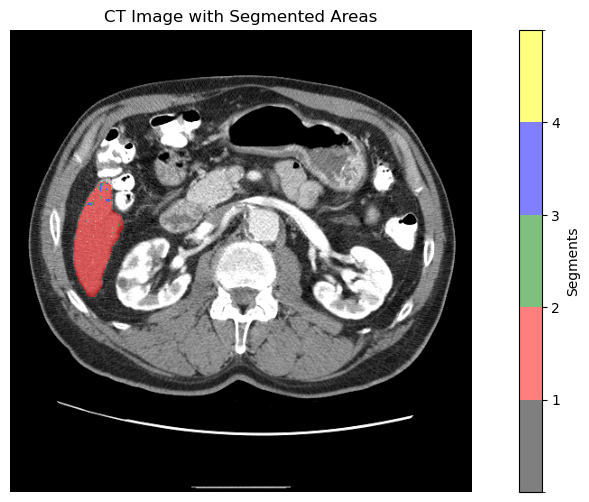

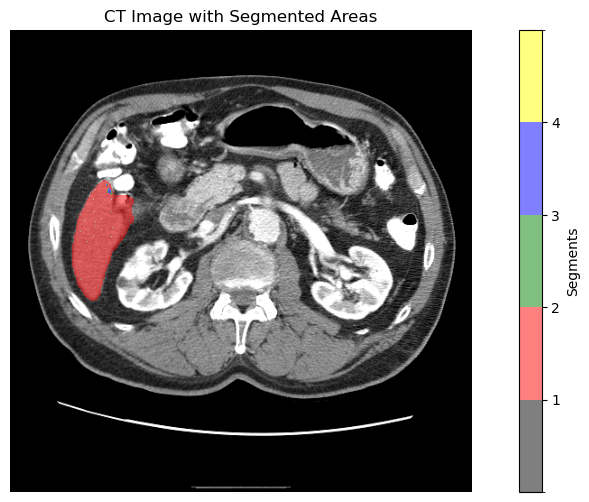

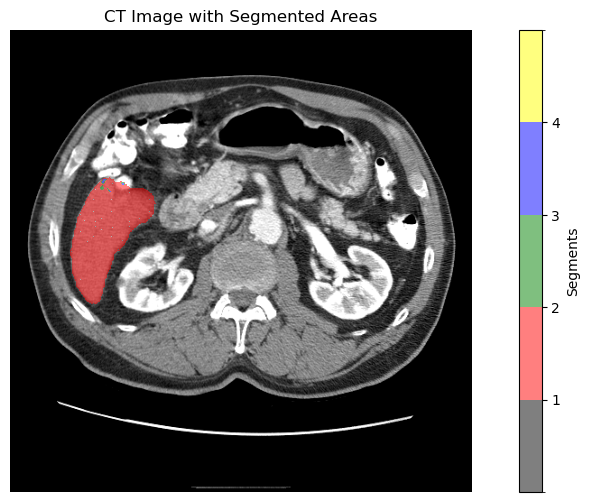

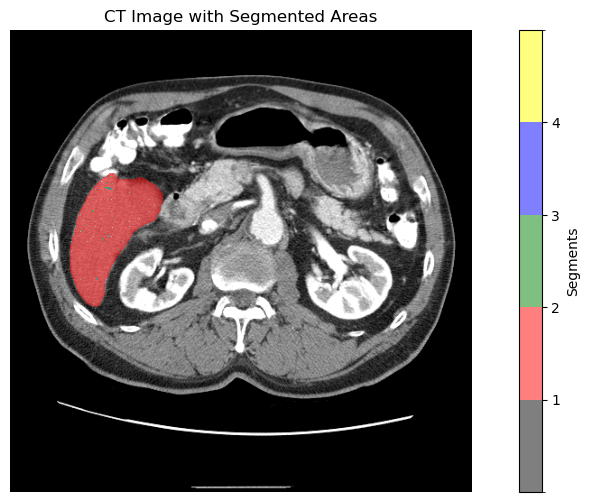

Segmentation array loaded with shape: (300, 512, 512)


In [119]:
# Visualize images and segmentations
for i in range(10):  # Example for the first 10 slices
    plot_ct_with_segmentations(windowed_ct_images[i+5, :, :], img_segmented[i+5, :, :])
print("Segmentation array loaded with shape:", segmentation_image.shape)

#### MIP

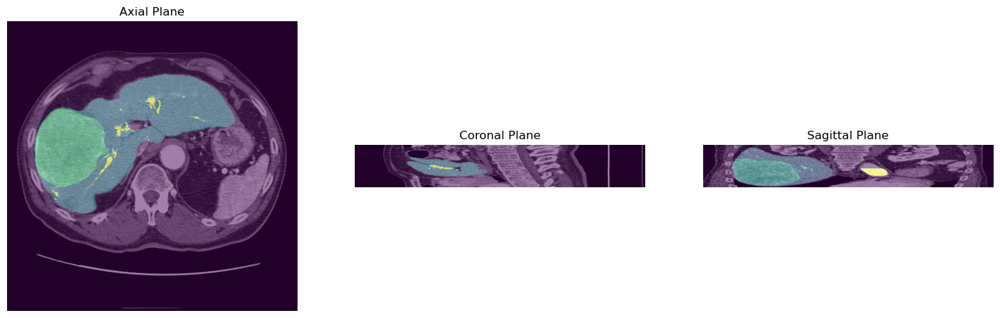

In [120]:
import numpy as np
import matplotlib.pyplot as plt

def plot_segmented_planes(ct_images, segmentation_images):
    # Extraer los cortes para cada plano
    axial_slice = ct_images[ct_images.shape[0] // 2, :, :]
    coronal_slice = ct_images[:, :, ct_images.shape[2] // 2]
    sagittal_slice = ct_images[:, ct_images.shape[1] // 2, :]

    # Extraer las segmentaciones para cada plano
    axial_seg = segmentation_images[ct_images.shape[0] // 2, :, :]
    coronal_seg = segmentation_images[:, :, ct_images.shape[2] // 2]
    sagittal_seg = segmentation_images[:, ct_images.shape[1] // 2, :]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Visualizar el plano Axial
    axes[0].imshow(axial_slice, cmap='gray')
    axes[0].imshow(axial_seg, cmap='viridis', alpha=0.5)
    axes[0].set_title('Axial Plane')
    axes[0].axis('off')

    # Visualizar el plano Coronal
    axes[1].imshow(coronal_slice, cmap='gray', aspect=aspect_ratio_coronal)
    axes[1].imshow(coronal_seg, cmap='viridis', alpha=0.5)
    axes[1].set_title('Coronal Plane')
    axes[1].axis('off')

    # Visualizar el plano Sagital
    axes[2].imshow(sagittal_slice, cmap='gray', aspect=aspect_ratio_sagittal)
    axes[2].imshow(sagittal_seg, cmap='viridis', alpha=0.5)
    axes[2].set_title('Sagittal Plane')
    axes[2].axis('off')

    plt.show()

plot_segmented_planes(windowed_ct_images, img_segmented)

In [121]:
def calculate_mip(volume, axis):
    """Calculate the Maximum Intensity Projection (MIP) along a given axis."""
    return np.max(volume, axis=axis)

def create_mips(ct_volume, segmentation_volume):
    """Calculate MIPs for all three planes and display them with a lilac color theme, including segmentations."""
    # Calcular MIPs para las imágenes CT
    mip_axial_ct = calculate_mip(ct_volume, axis=0)
    mip_coronal_ct = calculate_mip(ct_volume, axis=1)
    mip_sagittal_ct = calculate_mip(ct_volume, axis=2)
    
    # Calcular MIPs para las segmentaciones
    mip_axial_seg = calculate_mip(segmentation_volume, axis=0)
    mip_coronal_seg = calculate_mip(segmentation_volume, axis=1)
    mip_sagittal_seg = calculate_mip(segmentation_volume, axis=2)

    return mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg

def display_mip_images(mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg):
    """Display MIP images for axial, coronal, and sagittal planes with customized color."""
    plt.figure(figsize=(18, 6))

    # Colormap personalizado que tiende al lila
    cmap = plt.get_cmap('twilight')
    cmap_seg = plt.get_cmap('viridis')  # Use a distinct colormap for segmentation overlay

    # Definir los percentiles para ajustar los valores de visualización de cada MIP
    vmin_a, vmax_a = np.percentile(mip_axial_ct, [2, 98])
    vmin_c, vmax_c = np.percentile(mip_coronal_ct, [2, 98])
    vmin_s, vmax_s = np.percentile(mip_sagittal_ct, [2, 98])

    # Axial
    plt.subplot(1, 3, 1)
    plt.imshow(mip_axial_ct, cmap=cmap, aspect='auto', vmin=vmin_a, vmax=vmax_a, origin='lower')
    plt.imshow(mip_axial_seg, cmap=cmap_seg, aspect='auto', alpha=0.7, origin='lower')
    plt.title('MIP Axial')
    plt.axis('off')

    # Coronal
    plt.subplot(1, 3, 2)
    plt.imshow(mip_coronal_ct, cmap=cmap, aspect=aspect_ratio_coronal, vmin=vmin_c, vmax=vmax_c, origin='lower')
    plt.imshow(mip_coronal_seg, cmap=cmap_seg, aspect=aspect_ratio_coronal, alpha=0.7, origin='lower')
    plt.title('MIP Coronal')
    plt.axis('off')

    # Sagittal
    plt.subplot(1, 3, 3)
    plt.imshow(mip_sagittal_ct, cmap=cmap, aspect=aspect_ratio_sagittal, vmin=vmin_s, vmax=vmax_s, origin='lower')
    plt.imshow(mip_sagittal_seg, cmap=cmap_seg, aspect=aspect_ratio_sagittal, alpha=0.7, origin='lower')
    plt.title('MIP Sagittal')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

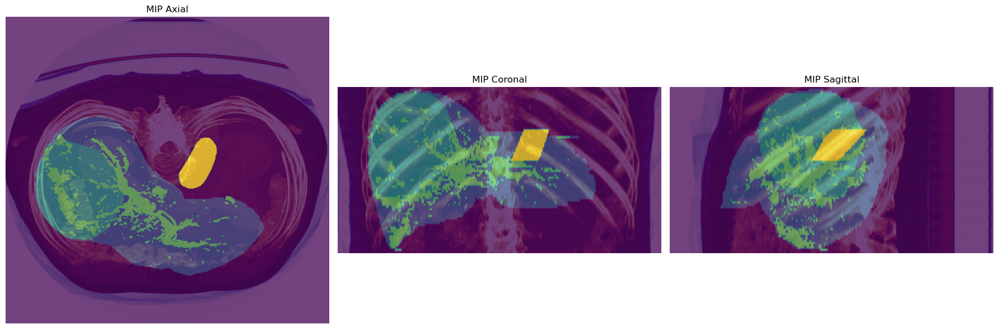

In [122]:
mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg = create_mips(ct_images, img_segmented)
display_mip_images(mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg)

### Animation

Animation saved to 'results/MIP/Animation.gif'


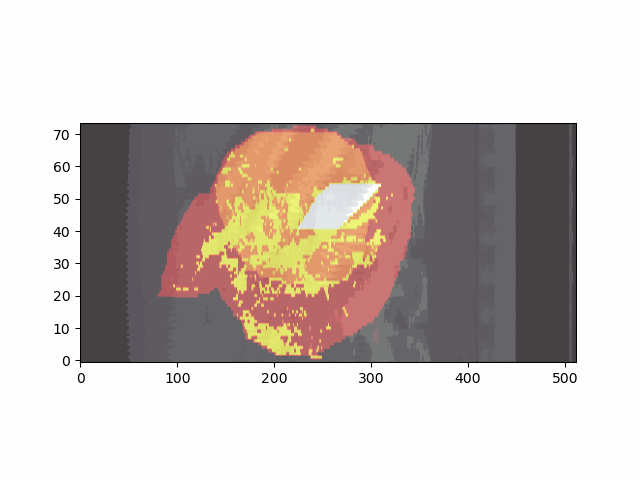

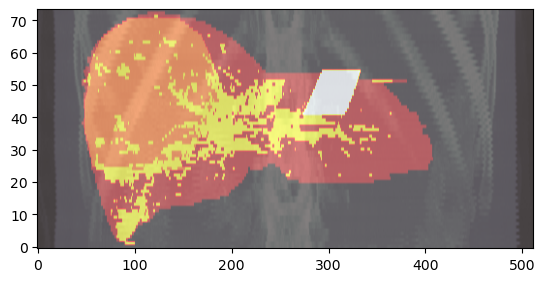

In [128]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pydicom

# Funciones para obtener planos MIP
def MIP_sagittal_plane(volume):
    return np.max(volume, axis=2)

def MIP_coronal_plane(volume):
    return np.max(volume, axis=1)

def rotate_on_axial_plane(volume, angle):
    """Rotar volumen en el plano axial."""
    return np.rot90(volume, k=int(angle // 90), axes=(1, 2))

def load_dicom_volume(directory):
    """Cargar todas las imágenes DICOM de un directorio y formar un volumen 3D."""
    slices = [pydicom.dcmread(os.path.join(directory, f)) for f in sorted(os.listdir(directory))]
    slices.sort(key=lambda x: float(x.ImagePositionPatient[2]))
    volume = np.stack([s.pixel_array for s in slices])
    return volume

def plot_3d_combined(ct_image, seg_image, pixel_len_mm, n=16, output_path='results/MIP'):
    """Plot 3D visualization of CT data and segmentation data."""
    os.makedirs(output_path, exist_ok=True)
    projections = []
    
    # Crear y guardar las proyecciones MIP
    for idx, alpha in enumerate(np.linspace(0, 360, num=n, endpoint=False)):
        rotated_ct_img = rotate_on_axial_plane(ct_image, alpha)
        rotated_seg_img = rotate_on_axial_plane(seg_image, alpha)

        projection_ct = MIP_sagittal_plane(rotated_ct_img)
        projection_seg = MIP_sagittal_plane(rotated_seg_img)

        # Guardar las proyecciones
        projections.append((projection_ct, projection_seg))
        plt.figure(figsize=(10, 5))
        plt.imshow(projection_ct, cmap='bone', aspect=pixel_len_mm[0] / pixel_len_mm[1], alpha=0.5, origin='lower')
        plt.imshow(projection_seg, cmap='hot', aspect=pixel_len_mm[0] / pixel_len_mm[1], alpha=0.5, origin='lower')
        plt.title(f'Projection {idx}')
        plt.axis('off')
        plt.savefig(f'{output_path}/Projection_{idx}.png')
        plt.close()

    # Crear la animación GIF
    fig, ax = plt.subplots()
    ani_frames = [
        [ax.imshow(proj[0], cmap='bone', aspect=pixel_len_mm[0] / pixel_len_mm[1], animated=True, alpha=0.5, origin='lower'),
         ax.imshow(proj[1], cmap='hot',  aspect=pixel_len_mm[0] / pixel_len_mm[1], animated=True, alpha=0.5, origin='lower')]
        for proj in projections
    ]
    anim = animation.ArtistAnimation(fig, ani_frames, interval=100, blit=True)
    gif_path = os.path.join(output_path, 'Animation.gif')
    anim.save(gif_path, writer='pillow')  # Use 'pillow' instead of 'imagemagick'

    print(f"Animation saved to '{gif_path}'")
    return gif_path



# Cargar y procesar las imágenes CT y segmentadas
ct_volume = load_dicom_volume(ct_directory)
dicom_segmentation = pydicom.dcmread(seg_directory)
segmentation_image = dicom_segmentation.pixel_array

pixel_len_mm = [3.27, 0.98, 0.98]

# Crear y guardar la animación
gif_path = plot_3d_combined(ct_volume, img_segmented, pixel_len_mm, n=16)

# Mostrar el GIF en el notebook
from IPython.display import Image
display(Image(filename=gif_path))

In [ ]:
180 graus dividit entre 16 --> Mos dona millor visualitzacio

#### 3D

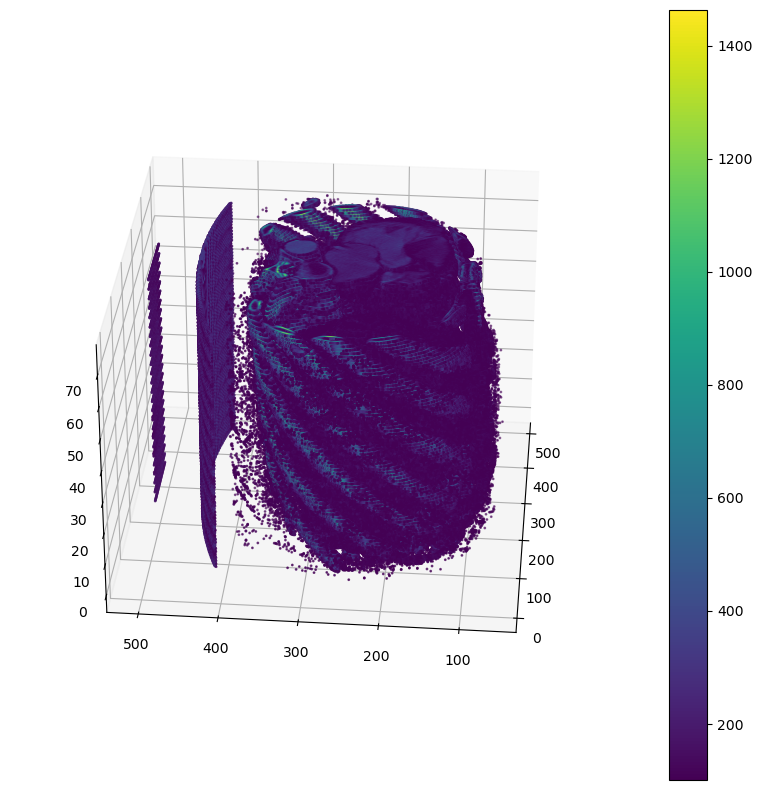

In [63]:
def plot_3d(image, threshold=-300, rotation_angle=360, interval=50):
    """Plot 3D visualization of CT data."""
    p = image.transpose(2, 1, 0)
    p = p.clip(min=threshold)
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    pos = np.where(p > threshold)
    scat = ax.scatter(pos[0], pos[1], pos[2], c=p[pos], cmap='viridis', s=1)
    ax.view_init(30, 185)
    ani = FuncAnimation(fig, lambda frame: ax.view_init(30, frame), frames=np.arange(0, rotation_angle, 2), interval=interval)
    plt.colorbar(scat, ax=ax, orientation='vertical')
    plt.show()
    return ani

plot_3d(ct_images, threshold=100)  # Adjust threshold as needed

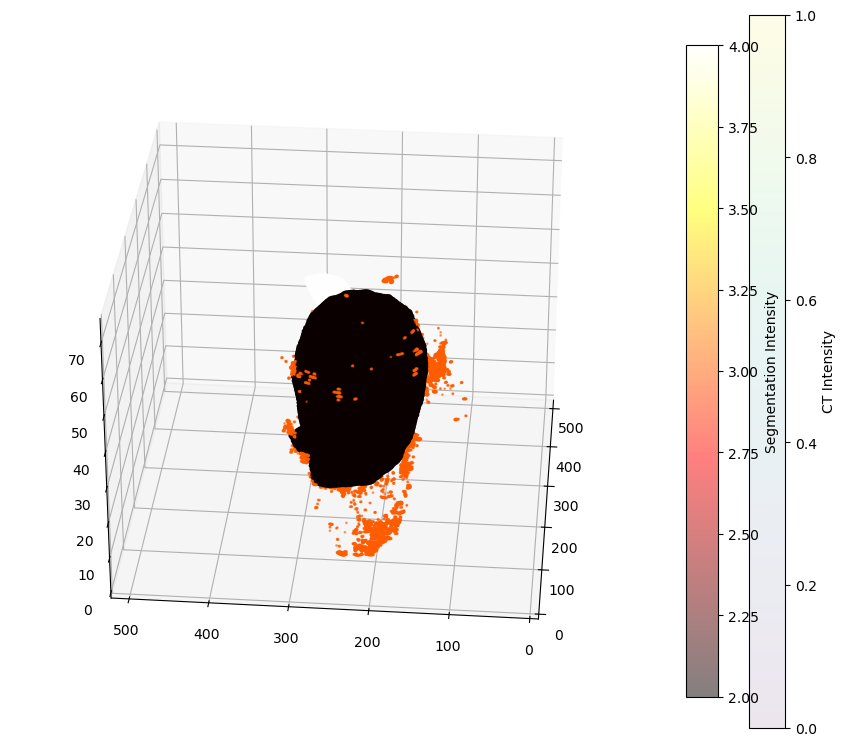

MovieWriter imagemagick unavailable; using Pillow instead.


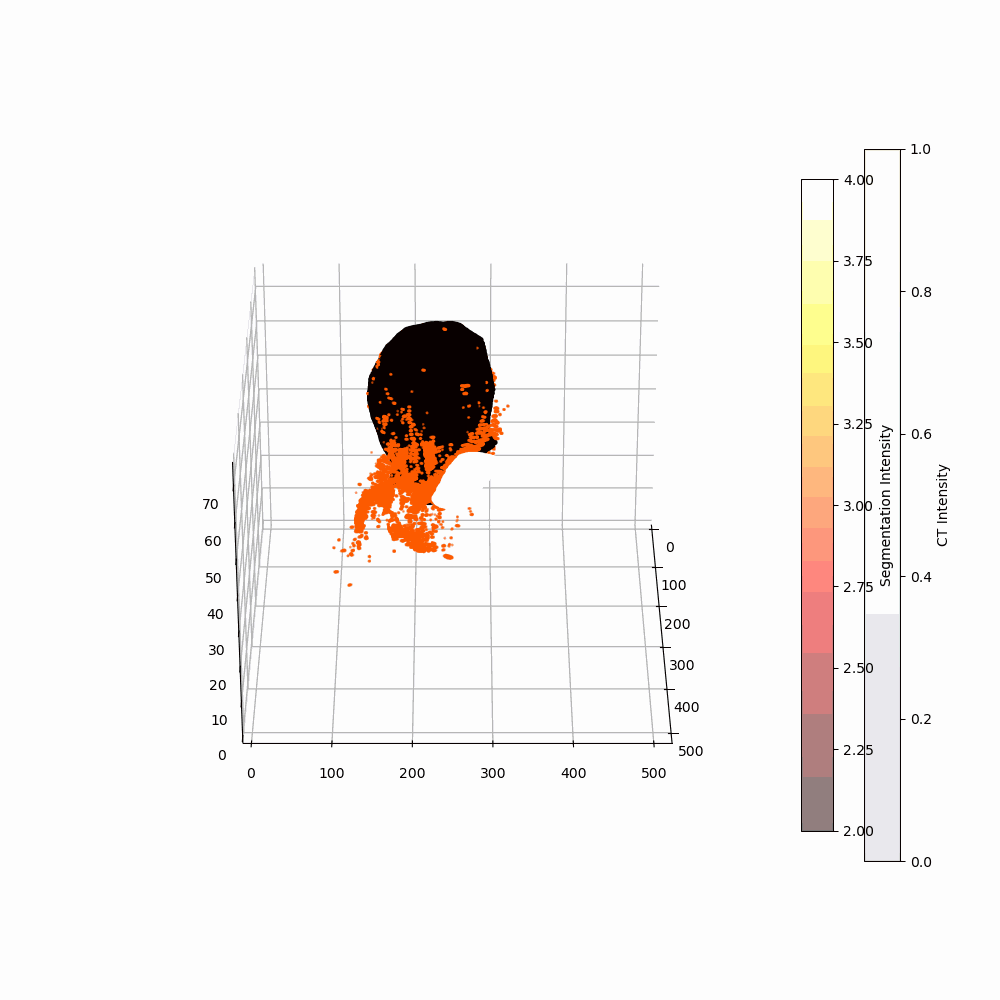

In [130]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
import imageio

# Normalizar las CT
def plot_3d(ct_image, seg_image, threshold_ct=-300, threshold_seg=1, rotation_angle=360, interval=50):
    """Plot 3D visualization of CT data and segmentation data."""
    # Preparar los datos de CT
    p_ct = ct_image.transpose(2, 1, 0)
    p_ct = p_ct.clip(min=threshold_ct)
    
    # Preparar los datos de Segmentación
    p_seg = seg_image.transpose(2, 1, 0)
    p_seg = p_seg.clip(min=threshold_seg)
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Posiciones de los puntos por encima del umbral
    pos_ct = np.where(p_ct > threshold_ct)
    pos_seg = np.where(p_seg > threshold_seg)
    
    # Scatter plot para CT
    scat_ct = ax.scatter(pos_ct[0], pos_ct[1], pos_ct[2], c=p_ct[pos_ct], cmap='viridis', s=1, alpha=0.1)
    
    # Scatter plot para Segmentación
    scat_seg = ax.scatter(pos_seg[0], pos_seg[1], pos_seg[2], c=p_seg[pos_seg], cmap='hot', s=1, alpha=0.5)
    
    # Configuración de la vista inicial
    ax.view_init(30, 185)
    
    # Animación
    ani = FuncAnimation(fig, lambda frame: ax.view_init(30, frame), frames=np.arange(0, rotation_angle, 2), interval=interval)
    
    # Ajustar los límites del gráfico 3D
    ax.set_xlim([0, ct_image.shape[2]])
    ax.set_ylim([0, ct_image.shape[1]])
    ax.set_zlim([0, ct_image.shape[0]])
    
    # Añadir barras de color
    cbar_ct = plt.colorbar(scat_ct, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_ct.set_label('CT Intensity')
    cbar_seg = plt.colorbar(scat_seg, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_seg.set_label('Segmentation Intensity')
    
    plt.show()
    
    return ani

# Asegúrate de que las dimensiones de las imágenes de CT son correctas
ct_images = np.array([file.pixel_array for file in sorted_ct_files])
windowed_ct_images = np.array([apply_window(img, window_center, window_width) for img in ct_images])

# Generar la animación
ani = plot_3d(windowed_ct_images, img_segmented, threshold_ct=100, threshold_seg=1)

# Guardar la animación como un GIF
ani.save('3d_rotation.gif', writer='imagemagick')

# Mostrar el GIF en el notebook
from IPython.display import Image
Image(filename='3d_rotation.gif')

# Image Coregistration

#### Loading and Preprocessing the Images

In [51]:
from pydicom import dcmread
import pylibjpeg
from scipy.optimize import minimize
from scipy.spatial.transform import Rotation as R
import numpy as np
from scipy.ndimage import affine_transform, zoom
import matplotlib.pyplot as plt
import pydicom
import os

In [81]:
reference_image_path = "Project/icbm_avg_152_t1_tal_nlin_symmetric_VI.dcm"
input_images_path = "Project/RM_Brain_3D-SPGR"

In [82]:
input_images = sort_dicom_files_by_position(load_dicom_files(input_images_path))
reference_image = dcmread(reference_image_path)

In [83]:
# Convert to numpy arrays for processing
input_images_np = np.array([img.pixel_array for img in input_images])
reference_image_np = reference_image.pixel_array

In [84]:
# Normalize images
reference_image_np = reference_image_np / np.max(reference_image_np)
input_images_np = input_images_np / np.max(input_images_np)

In [85]:
print("Loaded reference image shape:", reference_image_np.shape)
print("Loaded input image stack shape:", input_images_np.shape)

Loaded reference image shape: (193, 229, 193)
Loaded input image stack shape: (212, 512, 512)


Visualisation of the images

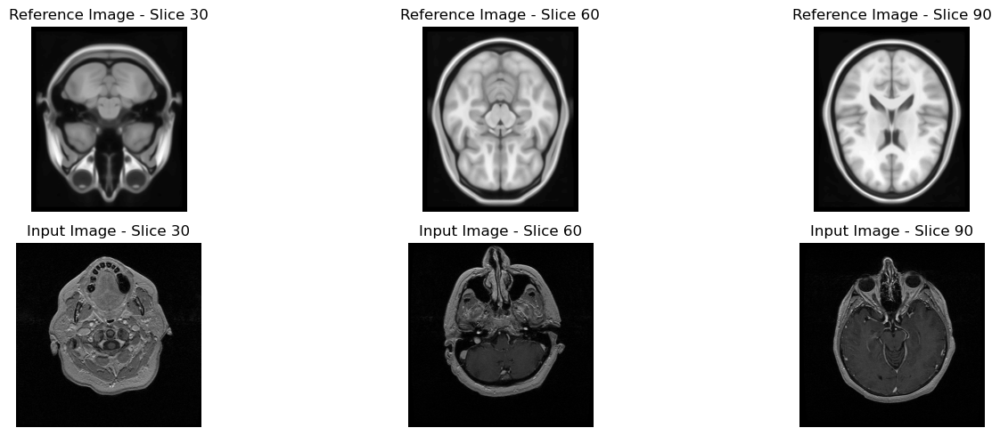

Reference shape: 193, input images shape: 212


In [86]:
# Visualize a few slices from the reference and input images
def visualize_slices(image1, image2, num_slices=3, title1='Reference Image', title2='Input Image'):
    fig, axes = plt.subplots(2, num_slices, figsize=(15, 5))
    for i in range(num_slices):
        slice_index = 30 * (i + 1)
        axes[0, i].imshow(image1[slice_index], cmap='gray')
        axes[0, i].set_title(f"{title1} - Slice {slice_index}")
        axes[0, i].axis('off')
        
        slice_index = 30 * (i + 1)
        axes[1, i].imshow(image2[slice_index], cmap='gray')
        axes[1, i].set_title(f"{title2} - Slice {slice_index}")
        axes[1, i].axis('off')
    plt.tight_layout()
    plt.show()

visualize_slices(reference_image_np, input_images_np)
print(f'Reference shape: {reference_image_np.shape[0]}, input images shape: {input_images_np.shape[0]}')

Con estos resultados podemos ver que las dos imágenes tienen una orientación diferente. Para alinearlas, tendremos que tener en cuenta esta diferencia. Es por ello que vamos a aplicar un alineamiento inicial.

In [87]:
# Stack the 2D slices into a 3D volume
input_images_np_volume = np.stack(input_images_np)
print("Input images volume shape:", input_images_np_volume.shape)

def resample_to_size(image, target_size=(128, 128, 128)):
    factors = np.array(target_size) / np.array(image.shape)
    resampled_image = zoom(image, factors, order=3)  # Using order=3 for cubic interpolation
    return resampled_image

# Resample both reference and input images to 128x128x128
resampled_reference_image_np = resample_to_size(reference_image_np)
resampled_input_images_np = resample_to_size(input_images_np_volume)  # Resampling the entire volume

print("Resampled reference image shape:", resampled_reference_image_np.shape)
print("Resampled input image shape:", resampled_input_images_np.shape)


Input images volume shape: (212, 512, 512)
Resampled reference image shape: (128, 128, 128)
Resampled input image shape: (128, 128, 128)


**Initial alignment**

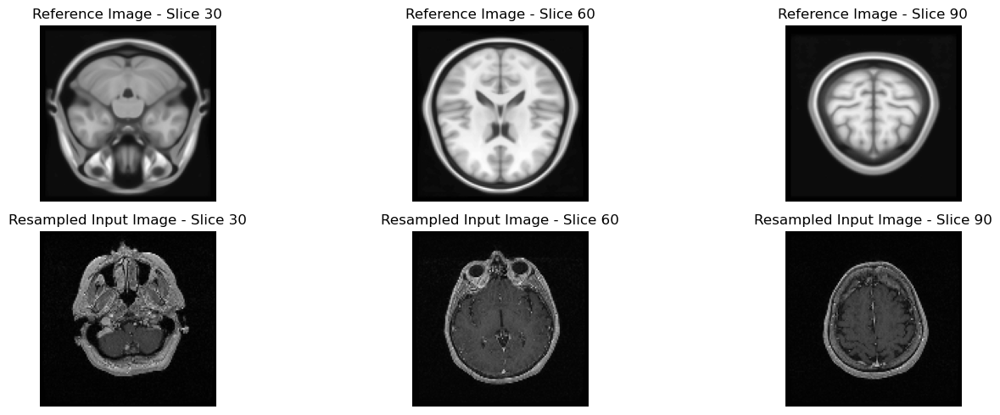

Reference shape: (128, 128, 128), input images shape: (128, 128, 128)


In [88]:
visualize_slices(resampled_reference_image_np, resampled_input_images_np, title1='Reference Image', title2='Resampled Input Image')
print(f'Reference shape: {resampled_reference_image_np.shape}, input images shape: {resampled_input_images_np.shape}')

si feim q els dos tensors siguin 128x128, me farà que sigui idferent --> Tensor de mides diferents pero s'objecte 
- mida de cada pxel fisica (pixel sppacing --> en cada slice com te mous en x,y) slice_thinkes --> en en y,z
- 

A ses anteriors, no es veuen ara més petites les input image?

#### Rigid motion & loss function

In [89]:
# Calculate the center of the image
def calculate_center(image):
    center = np.array(image.shape) / 2
    return center

# Quaternions --> Rotation & transltion
def rigid_transform(image, quaternion, translation, output_shape):
    center = calculate_center(image)
    rotation = R.from_quat(quaternion)
    rotation_matrix = rotation.as_matrix()
    
    # Create the full affine transformation matrix
    affine_matrix = np.eye(4)
    affine_matrix[:3, :3] = rotation_matrix
    affine_matrix[:3, 3] = translation - (rotation_matrix @ center) + center

    # Apply affine transformation with higher-order interpolation
    transformed_image = affine_transform(image, rotation_matrix, offset=translation - (rotation_matrix @ center) + center, output_shape=output_shape, order=3, mode='constant', cval=0.0)
    return transformed_image

# Compute MSE between reference image and transformed
def compute_mse(fixed, moving):
    return np.mean((fixed - moving) ** 2)

#### Optimization of transform parameters

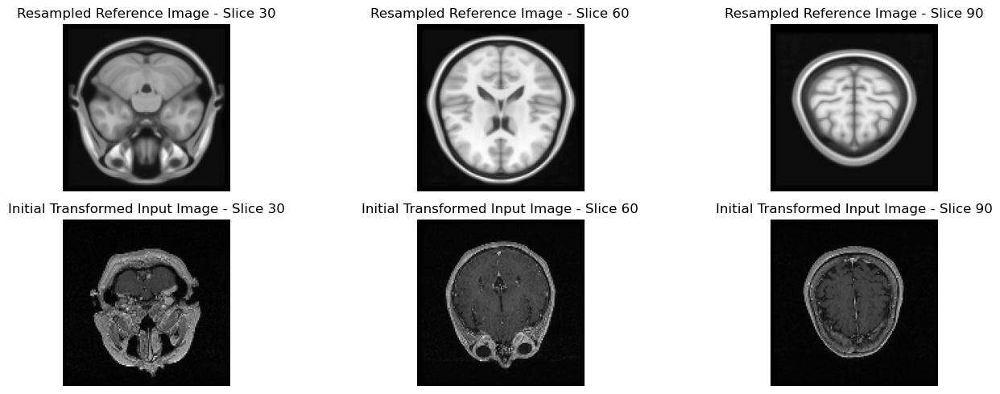

Initial MSE: 0.06299261976247801
Optimized parameters:
 [ 1.08241225e+00 -1.40941454e-02 -1.00682625e-02  2.40519604e-03
  1.30367788e+00 -2.60803011e+00 -1.17300621e+00]
Optimized MSE: 0.062327203774914595


'\nAngulo como empieza y como acaba\n'

In [90]:
# Objective function ==> Minimze the error (MSE) adjusting the quaternion and translation parameters
def objective_function(params, fixed_image, moving_image):
    quaternion = params[:4]
    translation = params[4:]
    transformed_image = rigid_transform(moving_image, quaternion, translation, fixed_image.shape)
    mse = compute_mse(fixed_image, transformed_image)
    return mse  # We want to minimize MSE

# Initial parameters (identity quaternion and zero translation)
initial_params = np.array([1, 0, 0, 0, 0, 0, 0])  # Identity quaternion and zero translation

# Apply initial transformation and visualize
initial_transformed_image = rigid_transform(resampled_input_images_np, initial_params[:4], initial_params[4:], resampled_reference_image_np.shape)
visualize_slices(resampled_reference_image_np, initial_transformed_image, title1='Resampled Reference Image', title2='Initial Transformed Input Image')

# Compute MSE before optimization
initial_mse = compute_mse(resampled_reference_image_np, initial_transformed_image)
print(f"Initial MSE: {initial_mse}")

# Optimize the transformation parameters
result = minimize(objective_function, initial_params, args=(resampled_reference_image_np, resampled_input_images_np), method='BFGS', options={'maxiter': 500, 'gtol': 1e-6})
optimal_params = result.x # Obtaining optimized parameters

# Extract optimized parameters
quaternion_opt = optimal_params[:4]
translation_opt = optimal_params[4:]

print("Optimized parameters:\n", optimal_params)

# Apply the optimal transformation to the resampled input images
optimized_transformed_image = rigid_transform(resampled_input_images_np, quaternion_opt, translation_opt, resampled_reference_image_np.shape)

# Compute MSE after optimization
optimized_mse = compute_mse(resampled_reference_image_np, optimized_transformed_image)
print(f"Optimized MSE: {optimized_mse}")


1. Intentar crear visualitzacions si el registre es bo o no
2. El nas no esta ben coregistrat, per tant amb el nas ho podrem vorer

--

Aplicar filtratge gausians --> blur image (32x32x32)
tolerancia o menys / iteracions


Visualisation the slices

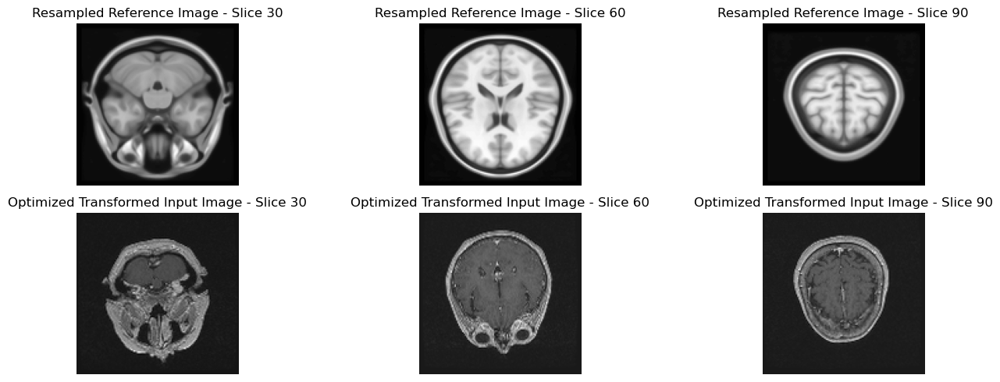

In [91]:
# Visualize the reference and transformed input images
visualize_slices(resampled_reference_image_np, optimized_transformed_image, title1='Resampled Reference Image', title2='Optimized Transformed Input Image')

Creating a gif for the result of the coregistration

/var/folders/gj/6tyw6rld1nn68w3tjknkqmkw0000gn/T/ipykernel_53640/1999560402.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread('temp.png'))


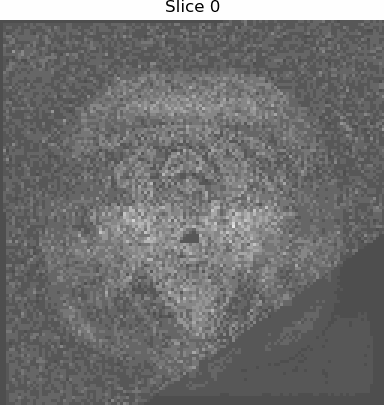

In [96]:
# Create GIF of overlayed images
def create_gif(reference_image, transformed_image, gif_path='coregistration_with_thalamus.gif'):
    images = []
    for i in range(reference_image.shape[0]):
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))
        ax.imshow(reference_image[i], cmap='gray', alpha=0.5)
        ax.imshow(transformed_image[i], cmap='gray', alpha=0.5)
        ax.axis('off')
        plt.title(f'Slice {i}')
        # Save the current figure as an image
        plt.savefig('temp.png', bbox_inches='tight', pad_inches=0)
        plt.close(fig)
        images.append(imageio.imread('temp.png'))
        os.remove('temp.png')
    imageio.mimsave(gif_path, images, duration=0.1)

def display_gif(gif_path):
    with open(gif_path, "rb") as file:
        display(Image(file.read()))

# Create GIF
create_gif(resampled_reference_image_np, optimized_transformed_image, gif_path='coregistration.gif')
display_gif('coregistration.gif')

## Thalamus Region

In [94]:
# Load the thalamus mask
def load_thalamus_mask(reference_image):
    thalamus_mask = np.zeros(reference_image.shape)
    thalamus_mask[30:35, 30:35, 30:35] = 1
    return thalamus_mask

# Applying the inverse transformation to the thalamus mask
def apply_inverse_transform(mask, quaternion, translation):
    center = calculate_center(mask)
    rotation = R.from_quat(quaternion)
    inverse_rotation = rotation.inv()
    
    def transform_coords(coords):
        coords_centered = coords - center[:, np.newaxis]
        rotated_coords = inverse_rotation.apply(coords_centered.T).T
        translated_coords = rotated_coords + center[:, np.newaxis] - translation[:, np.newaxis]
        return translated_coords
    
    coords = np.indices(mask.shape).reshape(3, -1)
    transformed_coords = transform_coords(coords).astype(int)
    
    # Ensure new coordinates are within bounds --> Antes me daba imágenes en negro
    valid_mask = np.all((transformed_coords >= 0) & (transformed_coords < np.array(mask.shape)[:, np.newaxis]), axis=0)
    transformed_coords = transformed_coords[:, valid_mask]
    original_coords = coords[:, valid_mask]
    
    transformed_mask = np.zeros(mask.shape, dtype=mask.dtype)
    transformed_mask[tuple(transformed_coords)] = mask[tuple(original_coords)]
    
    return transformed_mask

# Load and apply the inverse transform to the thalamus mask
thalamus_mask = load_thalamus_mask(resampled_reference_image_np)
inverse_transformed_thalamus = apply_inverse_transform(thalamus_mask, quaternion_opt, translation_opt)

#### Visualisation of the Thalamus Region

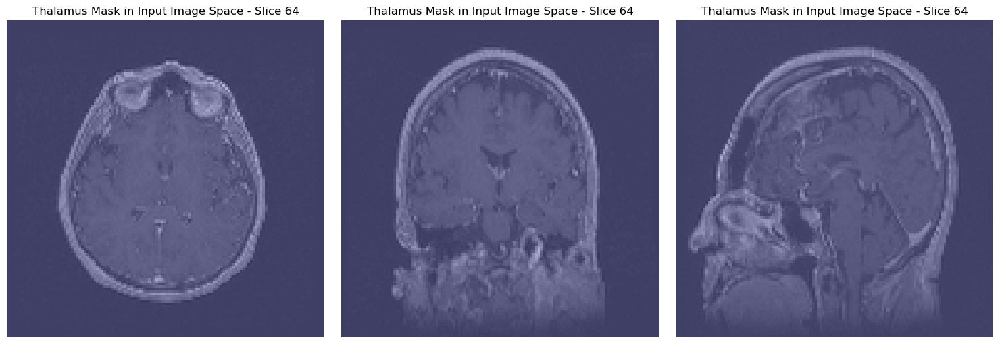

'\npintar thalamus\n'

In [95]:
# Función para visualizar la máscara del tálamo en el espacio de la imagen de entrada
def visualize_mask_in_input_space(image, mask, title='Thalamus Mask in Input Image Space'):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i in range(3):
        slice_index = mask.shape[i] // 2
        if i == 0:
            slice_image = np.flipud(image[slice_index])
            slice_mask = np.flipud(mask[slice_index])
        elif i == 1:
            slice_image = np.flipud(image[:, slice_index])
            slice_mask = np.flipud(mask[:, slice_index])
        else:
            slice_image = np.fliplr(np.flipud(image[:, :, slice_index]))
            slice_mask = np.fliplr(np.flipud(mask[:, :, slice_index]))
        axes[i].imshow(slice_image, cmap='gray', alpha=0.7)
        axes[i].imshow(slice_mask, cmap='jet', alpha=0.3)
        axes[i].set_title(f"{title} - Slice {slice_index}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

visualize_mask_in_input_space(optimized_transformed_image, inverse_transformed_thalamus)

'''
pintar thalamus
'''

Creating a gif for result visualisation

/var/folders/gj/6tyw6rld1nn68w3tjknkqmkw0000gn/T/ipykernel_53640/2006559335.py:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread('temp.png'))


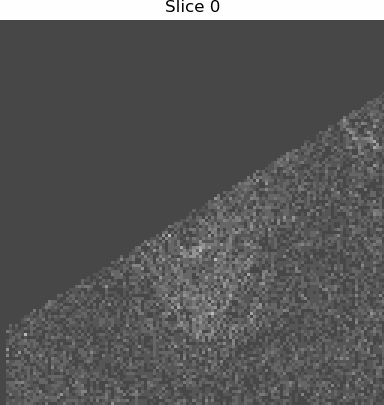

In [69]:
# Create GIF of overlayed images
def create_thalamus_gif(reference_image, transformed_image, thalamus_mask, gif_path='coregistration_with_thalamus.gif'):
    images = []
    for i in range(reference_image.shape[0]):
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))
        ax.imshow(reference_image[i], cmap='gray', alpha=0.5)
        ax.imshow(transformed_image[i], cmap='gray', alpha=0.5)
        thalamus_overlay = np.ma.masked_where(thalamus_mask[i] == 0, thalamus_mask[i])
        ax.imshow(thalamus_overlay, cmap='jet', alpha=0.5)  # Ensure the thalamus mask is clearly visible
        ax.axis('off')
        plt.title(f'Slice {i}')
        # Save the current figure as an image
        plt.savefig('temp.png', bbox_inches='tight', pad_inches=0)
        plt.close(fig)
        images.append(imageio.imread('temp.png'))
        os.remove('temp.png')
    imageio.mimsave(gif_path, images, duration=0.1)

def display_gif(gif_path):
    with open(gif_path, "rb") as file:
        display(Image(file.read()))

# Create GIF
create_thalamus_gif(resampled_reference_image_np, optimized_transformed_image, inverse_transformed_thalamus, gif_path='coregistration_with_thalamus.gif')
display_gif('coregistration_with_thalamus.gif')

s'ha de pintar es thalamus a s'image de input a reference, ara es thalamo l'hem de conseguir a l'espai input. Invertir rotacio i despres translació.